 # PM-PR-0027 : Forecasting Spare parts inventory

# Business Case: 
The case business case is on the inventory management. Keeping Inventory of spare in various service centre to the market demand is always a challenge as most service centres spends significant amount in spare parts inventory costs. In spite of this, availability of spare parts is been one of the problem areas.

# PROJECT GOAL
Create Predictive model for inventory forecasting so that 
service centre achieve JIT standards.

# Domain Analysis

* **invoice_date:** This column conatins the invoice dates.
* **job_card_date:** This column conatins the Job card dates.
* **business_partner_name:** This column conatins the name of different Bussiness partners.
* **vehicle_no:** This columns conatins the vehicle number of different vehicles.
* **vehicle_model:** This columns contains the model of different vehicles.
* **current_km_reading:** This column conatins the current Kilometer(KM) reading of vehicles.
* **invoice_line_text:** This columns contains the categories of spare parts.

# Import Basic Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
import warnings
warnings.filterwarnings('ignore')

In [2]:
#Loading the Dataset
data = pd.read_csv('service_data.csv')
data

,invoice_date,job_card_date,business_partner_name,vehicle_no,vehicle_model,current_km_reading,invoice_line_text
0,30-05-17,30-05-17,shivXXXXXXXXXX,KA03MFXXXX,BAJAJ AVENGER STREET 220,50000,ENGINE OIL
1,02-06-17,31-05-17,KIRAXXXXXXXXXX,KA53ESXXXX,BAJAJ PULSAR NS 200,758,ENGINE OIL
2,02-06-17,31-05-17,KIRAXXXXXXXXXX,KA53ESXXXX,BAJAJ PULSAR NS 200,758,POLISH
3,02-06-17,31-05-17,KIRAXXXXXXXXXX,KA53ESXXXX,BAJAJ PULSAR NS 200,758,CONSUMABLES
4,02-06-17,31-05-17,KIRAXXXXXXXXXX,KA53ESXXXX,BAJAJ PULSAR NS 200,758,COOLANT OIL
...,...,...,...,...,...,...,...
28477,06-01-19,06-01-19,pravXXXXXXXXXX,KA53EVXXXX,BAJAJ DISCOVER 125,12805,SPROCKET RUBBER
28478,06-01-19,06-01-19,pravXXXXXXXXXX,KA53EVXXXX,BAJAJ DISCOVER 125,12805,CLUTCH CABLE
28479,06-01-19,06-01-19,pravXXXXXXXXXX,KA53EVXXXX,BAJAJ DISCOVER 125,12805,OIL FILTER
28480,06-01-19,06-01-19,pravXXXXXXXXXX,KA53EVXXXX,BAJAJ DISCOVER 125,12805,DISC OIL


# Basic Checks

In [3]:
data.shape #rows and columns

(28482, 7)

In [4]:
data.tail() # Bottom 5 records

,invoice_date,job_card_date,business_partner_name,vehicle_no,vehicle_model,current_km_reading,invoice_line_text
28477,06-01-19,06-01-19,pravXXXXXXXXXX,KA53EVXXXX,BAJAJ DISCOVER 125,12805,SPROCKET RUBBER
28478,06-01-19,06-01-19,pravXXXXXXXXXX,KA53EVXXXX,BAJAJ DISCOVER 125,12805,CLUTCH CABLE
28479,06-01-19,06-01-19,pravXXXXXXXXXX,KA53EVXXXX,BAJAJ DISCOVER 125,12805,OIL FILTER
28480,06-01-19,06-01-19,pravXXXXXXXXXX,KA53EVXXXX,BAJAJ DISCOVER 125,12805,DISC OIL
28481,06-01-19,06-01-19,pravXXXXXXXXXX,KA53EVXXXX,BAJAJ DISCOVER 125,12805,AIR FILTER


In [5]:
data.head() #top 5 records

,invoice_date,job_card_date,business_partner_name,vehicle_no,vehicle_model,current_km_reading,invoice_line_text
0,30-05-17,30-05-17,shivXXXXXXXXXX,KA03MFXXXX,BAJAJ AVENGER STREET 220,50000,ENGINE OIL
1,02-06-17,31-05-17,KIRAXXXXXXXXXX,KA53ESXXXX,BAJAJ PULSAR NS 200,758,ENGINE OIL
2,02-06-17,31-05-17,KIRAXXXXXXXXXX,KA53ESXXXX,BAJAJ PULSAR NS 200,758,POLISH
3,02-06-17,31-05-17,KIRAXXXXXXXXXX,KA53ESXXXX,BAJAJ PULSAR NS 200,758,CONSUMABLES
4,02-06-17,31-05-17,KIRAXXXXXXXXXX,KA53ESXXXX,BAJAJ PULSAR NS 200,758,COOLANT OIL


In [6]:
data.info() #Information of dataset,checking datatypes

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28482 entries, 0 to 28481
Data columns (total 7 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   invoice_date           28482 non-null  object
 1   job_card_date          28482 non-null  object
 2   business_partner_name  28482 non-null  object
 3   vehicle_no             28482 non-null  object
 4   vehicle_model          28482 non-null  object
 5   current_km_reading     28482 non-null  int64 
 6   invoice_line_text      28448 non-null  object
dtypes: int64(1), object(6)
memory usage: 1.5+ MB


In [7]:
data.describe() #Statistical Analysis

,current_km_reading
count,28482.000000
mean,19348.003827
std,25246.722306
min,0.000000
25%,3988.000000
50%,12420.500000
75%,27905.000000
max,610112.000000


In [8]:
data.describe(include='O') #checking Categorical columns

,invoice_date,job_card_date,business_partner_name,vehicle_no,vehicle_model,invoice_line_text
count,28482,28482,28482,28482,28482,28448
unique,555,553,1010,846,28,502
top,01-12-18,01-12-18,venkXXXXXXXXXX,KA53EVXXXX,BAJAJ PULSAR 150,ENGINE OIL
freq,179,179,424,1313,8633,3802


In [9]:
data.columns# Getting all columns form the dataset

Index(['invoice_date', 'job_card_date', 'business_partner_name', 'vehicle_no',
       'vehicle_model', 'current_km_reading', 'invoice_line_text'],
      dtype='object')

In [10]:
pd.set_option('display.max_rows',None)# Getting maximum rows form the dataset

In [11]:
data

,invoice_date,job_card_date,business_partner_name,vehicle_no,vehicle_model,current_km_reading,invoice_line_text
0,30-05-17,30-05-17,shivXXXXXXXXXX,KA03MFXXXX,BAJAJ AVENGER STREET 220,50000,ENGINE OIL
1,02-06-17,31-05-17,KIRAXXXXXXXXXX,KA53ESXXXX,BAJAJ PULSAR NS 200,758,ENGINE OIL
2,02-06-17,31-05-17,KIRAXXXXXXXXXX,KA53ESXXXX,BAJAJ PULSAR NS 200,758,POLISH
3,02-06-17,31-05-17,KIRAXXXXXXXXXX,KA53ESXXXX,BAJAJ PULSAR NS 200,758,CONSUMABLES
4,02-06-17,31-05-17,KIRAXXXXXXXXXX,KA53ESXXXX,BAJAJ PULSAR NS 200,758,COOLANT OIL
5,02-06-17,31-05-17,KIRAXXXXXXXXXX,KA53ESXXXX,BAJAJ PULSAR NS 200,758,CHAIN LUBRICATION
6,02-06-17,31-05-17,KIRAXXXXXXXXXX,KA53ESXXXX,BAJAJ PULSAR NS 200,758,4 WAY SWITCH
7,31-05-17,31-05-17,pattXXXXXXXXXX,KA53EMXXXX,BAJAJ PLATINA,3717,ENGINE OIL
8,31-05-17,31-05-17,pattXXXXXXXXXX,KA53EMXXXX,BAJAJ PLATINA,3717,3M OIL
9,31-05-17,31-05-17,pattXXXXXXXXXX,KA53EMXXXX,BAJAJ PLATINA,3717,CHAIN LUBRICATION


In [12]:
#Creating new column Orders_on_Demand
data.loc[data.invoice_line_text!=0,'Orders_on_Demand']=1  #rows having atleast one order
data.head(4)

,invoice_date,job_card_date,business_partner_name,vehicle_no,vehicle_model,current_km_reading,invoice_line_text,Orders_on_Demand
0,30-05-17,30-05-17,shivXXXXXXXXXX,KA03MFXXXX,BAJAJ AVENGER STREET 220,50000,ENGINE OIL,1.0
1,02-06-17,31-05-17,KIRAXXXXXXXXXX,KA53ESXXXX,BAJAJ PULSAR NS 200,758,ENGINE OIL,1.0
2,02-06-17,31-05-17,KIRAXXXXXXXXXX,KA53ESXXXX,BAJAJ PULSAR NS 200,758,POLISH,1.0
3,02-06-17,31-05-17,KIRAXXXXXXXXXX,KA53ESXXXX,BAJAJ PULSAR NS 200,758,CONSUMABLES,1.0


In [13]:
data.isnull().sum()

invoice_date              0
job_card_date             0
business_partner_name     0
vehicle_no                0
vehicle_model             0
current_km_reading        0
invoice_line_text        34
Orders_on_Demand          0
dtype: int64

In [14]:
data.dropna(axis=0,inplace=True) #dropping null values

In [15]:
data.duplicated().sum()

367

In [16]:
# Remove duplicates from the original DataFrame
data.drop_duplicates(inplace=True)

In [17]:
#Numerical columns
data.select_dtypes(include=['int64','float64']).columns

Index(['current_km_reading', 'Orders_on_Demand'], dtype='object')

# Convert Datatype(invoice_date,job_card_date) to datetime

In [18]:
data['job_card_date']=pd.to_datetime(data['job_card_date'])

In [19]:
data['invoice_date']=pd.to_datetime(data['invoice_date'])

In [20]:
type(data['job_card_date'].iloc[0])

pandas._libs.tslibs.timestamps.Timestamp

In [21]:
type(data['invoice_date'].iloc[0])

pandas._libs.tslibs.timestamps.Timestamp

In [22]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 28081 entries, 0 to 28481
Data columns (total 8 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   invoice_date           28081 non-null  datetime64[ns]
 1   job_card_date          28081 non-null  datetime64[ns]
 2   business_partner_name  28081 non-null  object        
 3   vehicle_no             28081 non-null  object        
 4   vehicle_model          28081 non-null  object        
 5   current_km_reading     28081 non-null  int64         
 6   invoice_line_text      28081 non-null  object        
 7   Orders_on_Demand       28081 non-null  float64       
dtypes: datetime64[ns](2), float64(1), int64(1), object(4)
memory usage: 1.9+ MB


### Find difference of days between job card date and invoice date

In [23]:
data['date_difference']=data['invoice_date']-data['job_card_date']

In [24]:
data.head()

,invoice_date,job_card_date,business_partner_name,vehicle_no,vehicle_model,current_km_reading,invoice_line_text,Orders_on_Demand,date_difference
0,2017-05-30,2017-05-30,shivXXXXXXXXXX,KA03MFXXXX,BAJAJ AVENGER STREET 220,50000,ENGINE OIL,1.0,0 days
1,2017-02-06,2017-05-31,KIRAXXXXXXXXXX,KA53ESXXXX,BAJAJ PULSAR NS 200,758,ENGINE OIL,1.0,-114 days
2,2017-02-06,2017-05-31,KIRAXXXXXXXXXX,KA53ESXXXX,BAJAJ PULSAR NS 200,758,POLISH,1.0,-114 days
3,2017-02-06,2017-05-31,KIRAXXXXXXXXXX,KA53ESXXXX,BAJAJ PULSAR NS 200,758,CONSUMABLES,1.0,-114 days
4,2017-02-06,2017-05-31,KIRAXXXXXXXXXX,KA53ESXXXX,BAJAJ PULSAR NS 200,758,COOLANT OIL,1.0,-114 days


In [25]:
Counter(data.date_difference)

Counter({Timedelta('0 days 00:00:00'): 27672,
         Timedelta('1 days 00:00:00'): 151,
         Timedelta('3 days 00:00:00'): 50,
         Timedelta('31 days 00:00:00'): 41,
         Timedelta('62 days 00:00:00'): 34,
         Timedelta('30 days 00:00:00'): 33,
         Timedelta('153 days 00:00:00'): 24,
         Timedelta('-86 days +00:00:00'): 23,
         Timedelta('-114 days +00:00:00'): 18,
         Timedelta('-115 days +00:00:00'): 8,
         Timedelta('19 days 00:00:00'): 7,
         Timedelta('59 days 00:00:00'): 6,
         Timedelta('-1 days +00:00:00'): 5,
         Timedelta('28 days 00:00:00'): 4,
         Timedelta('120 days 00:00:00'): 3,
         Timedelta('-70 days +00:00:00'): 2})

In [26]:
data[data.date_difference =='1days']

,invoice_date,job_card_date,business_partner_name,vehicle_no,vehicle_model,current_km_reading,invoice_line_text,Orders_on_Demand,date_difference
567,2017-06-14,2017-06-13,raghXXXXXXXXXX,KA53ESXXXX,BAJAJ PULSAR 150,587,ENGINE OIL,1.0,1 days
568,2017-06-14,2017-06-13,raghXXXXXXXXXX,KA53ESXXXX,BAJAJ PULSAR 150,587,3M OIL,1.0,1 days
569,2017-06-14,2017-06-13,raghXXXXXXXXXX,KA53ESXXXX,BAJAJ PULSAR 150,587,CONSUMABLES,1.0,1 days
570,2017-06-14,2017-06-13,raghXXXXXXXXXX,KA53ESXXXX,BAJAJ PULSAR 150,587,CHAIN LUBRICATION,1.0,1 days
571,2017-06-14,2017-06-13,raghXXXXXXXXXX,KA53ESXXXX,BAJAJ PULSAR 150,587,POLISH,1.0,1 days
631,2017-06-15,2017-06-14,naveXXXXXXXXXX,KA53W3XXXX,BAJAJ DISCOVER 150,25677,FOOT REST RUBBER,1.0,1 days
633,2017-06-15,2017-06-14,naveXXXXXXXXXX,KA53W3XXXX,BAJAJ DISCOVER 150,25677,ENGINE OIL,1.0,1 days
634,2017-06-15,2017-06-14,naveXXXXXXXXXX,KA53W3XXXX,BAJAJ DISCOVER 150,25677,AIR FILTER CHECKUP,1.0,1 days
636,2017-06-15,2017-06-14,naveXXXXXXXXXX,KA53W3XXXX,BAJAJ DISCOVER 150,25677,GENERAL SERVICE,1.0,1 days
637,2017-06-15,2017-06-14,naveXXXXXXXXXX,KA53W3XXXX,BAJAJ DISCOVER 150,25677,BRAKE SHOE,1.0,1 days


# Exploratory Data Analysis(EDA)

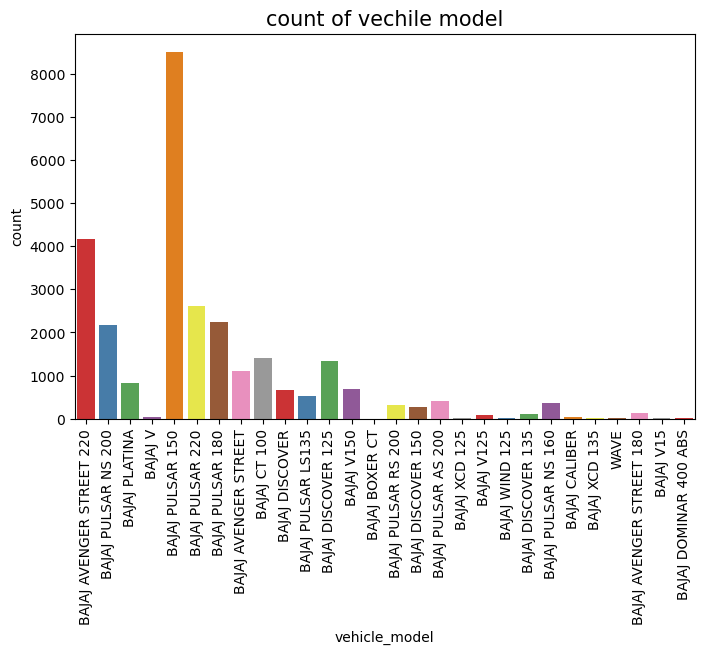

In [27]:
#Bar chart showing most preferred vechicle
##A countplot basically counts the categories and returns a count of their occurrences.
plt.figure(figsize=(8,5))
sns.countplot(x='vehicle_model',data=data,palette="Set1")
plt.xticks(rotation=90)
plt.title("count of vechile model",fontdict={'fontsize':15,'color':'black'},loc='center')
plt.show()

**Insights**
* Maximum number of data is of BAJAJ PULSAR 150 vehicle model.
* The Second highest number of data is of BAJAJ AVENGER STREET 220 vehicle model.
* The least number of data is of BAJAJ XCD 135 and BAJAJ BOXER CT vehicle model.

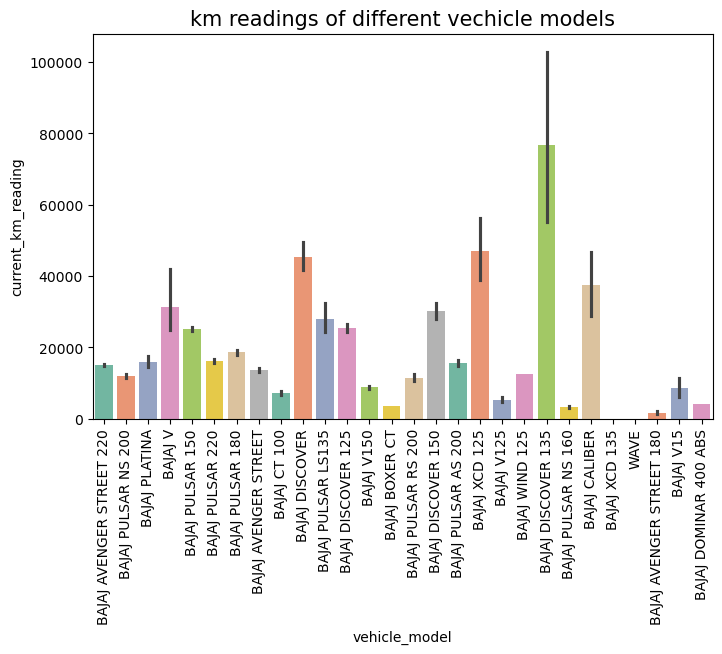

In [28]:
# vehicle model vs current_km_reading 
##A barplot is basically used to aggregate the categorical data according to some methods and by default its the mean.
#To use this plot we choose a categorical column for the x axis and a numerical column for the y axis and we see that it
# creates a plot taking a mean per categorical column.
plt.figure(figsize=(8,5))
sns.barplot(x='vehicle_model',y='current_km_reading',data=data,palette="Set2")
plt.xticks(rotation=90)
plt.title("km readings of different vechicle models",fontdict={'fontsize':15,'color':'black'},loc='center')
plt.show()

**Insights**
* BAJAJ DISCOVER 135 has the highest Current KM Reading as compared to other vehicle models.
* BAJAJ DISCOVER and BAJAJ XCD 125 has the Second highest current km reading as compared to other vehicle models.

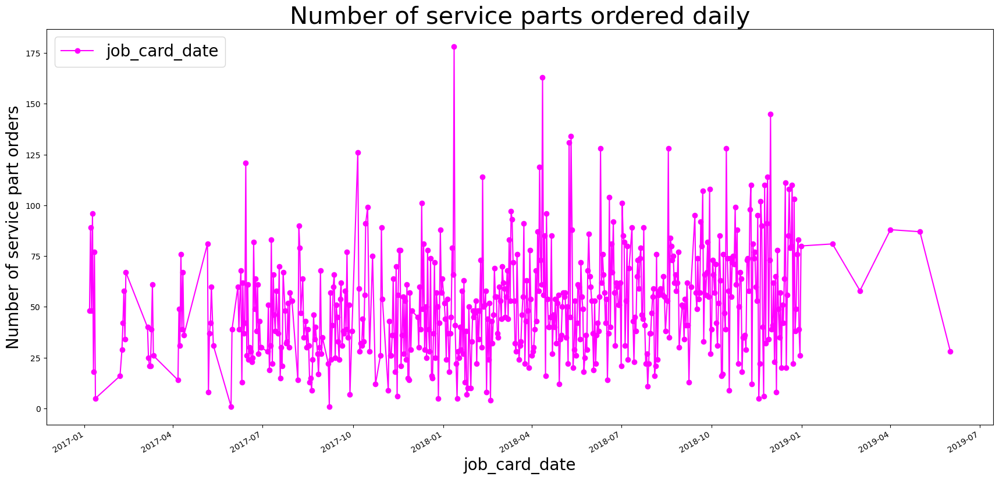

In [29]:
d1=data.groupby(['job_card_date'])['job_card_date'].count().to_frame()
d1.plot(kind='line',figsize=[21,10],color='magenta',marker='o')
plt.title("Number of service parts ordered daily",fontdict={'fontsize':30,'color':'black'},loc='center')
plt.ylabel("Number of service part orders",fontdict={'fontsize':20})
plt.xlabel("job_card_date",fontdict={'fontsize':20})
plt.legend(loc='upper left',frameon=True, labelspacing=1,fontsize=20)

**Insights**
* Maximum number of service parts ordered on one day is in the First Month of 2018.
* The Average orders on daily basis is between 25-100.
* There are few days where there are no orders on daily basis.

Text(0.5, 1.0, 'Most sold service parts')

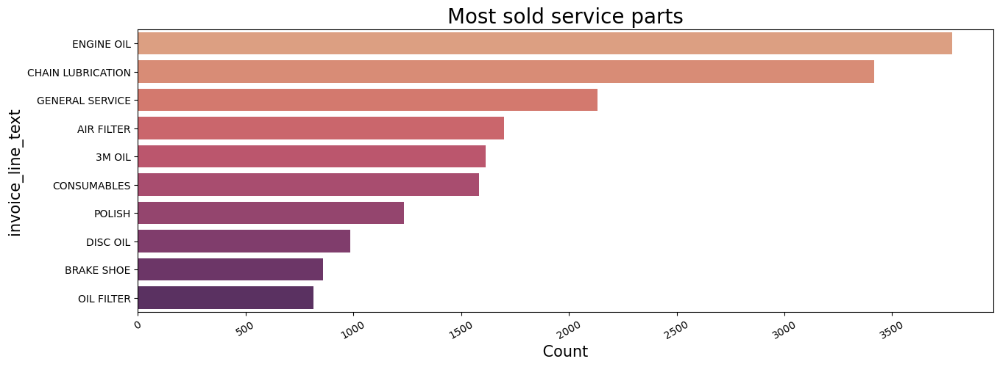

In [30]:
plt.figure(figsize=(15,5))
sns.countplot(data['invoice_line_text'],order=data['invoice_line_text'].value_counts().index[:10],palette="flare")
plt.xticks(rotation=30)
plt.ylabel("invoice_line_text",fontsize=15)
plt.xlabel(" Count ",fontsize=15)
plt.title("Most sold service parts",fontdict={'fontsize':20})

**Insights**
* ENGINE OIL is the most sold service part.
* CHAIN LUBRICATION is the second highest sold service part.
* AIR FILTER is the third highest most sold service part.

Text(0.5, 1.0, 'Least sold service parts')

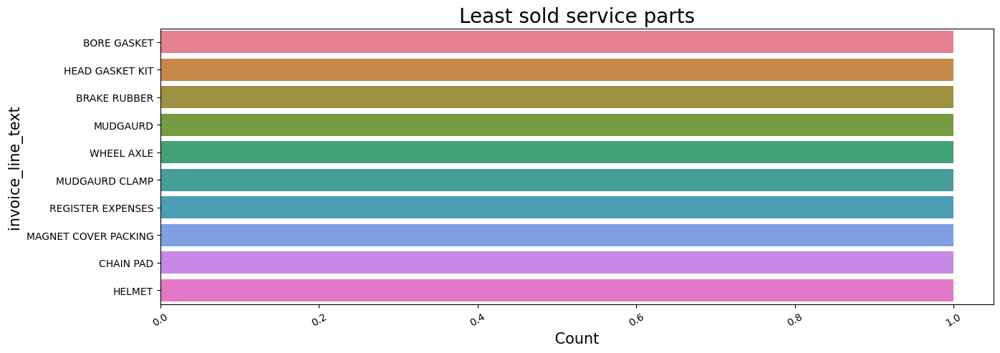

In [31]:
plt.figure(figsize=(15,5))
sns.countplot(data['invoice_line_text'],order=data['invoice_line_text'].value_counts().index[-10:],palette="husl")
plt.xticks(rotation=30)
plt.ylabel("invoice_line_text",fontsize=15,color='black')
plt.xlabel(" Count ",fontsize=15,color='black')
plt.title("Least sold service parts",fontdict={'fontsize':20})

**Insights**
* BORE GASKET, HEAD GASKET KIT, BRAKE RUBBER, MUDGAURD, WHEEL AXLE, MUDGAURD CLAMP, REGISTER EXPENSES, MAGNET COVER PACKING, CHAIN PAD, HELMET this are the least sold service parts in our dataset.

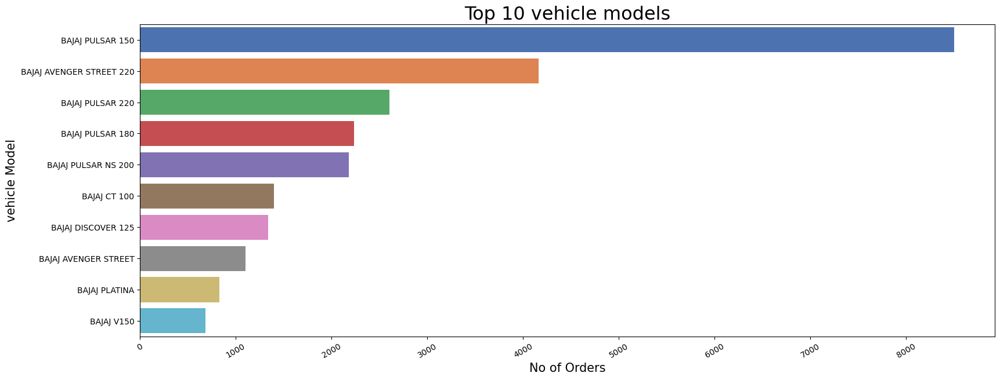

In [32]:
plt.figure(figsize=[19,7])
sns.countplot(data['vehicle_model'],order=data['vehicle_model'].value_counts().iloc[:10].index,saturation=10,palette="deep")
plt.ylabel("vehicle Model",fontdict={'fontsize':15},color='black')
plt.xlabel('No of Orders',fontdict={'fontsize':15},color='black')
plt.xticks(rotation=30)
plt.title("Top 10 vehicle models",fontdict={'fontsize':23});

**Insights**
* Above are the Top 10 Vehicles which are getting the maximum number of orders as compared to other models.
* BAJAJ PULSAR 150 vehicle model has the highest number of orders in our data.
* BAJAJ AVENGER STREET 220 vehicle model has the second highest number of orders in our data.


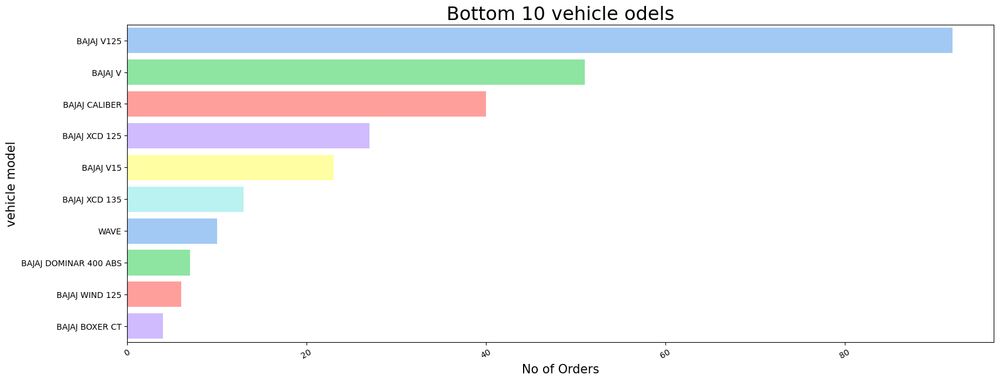

In [33]:
plt.figure(figsize=[19,7])
sns.countplot(data['vehicle_model'],order=data['vehicle_model'].value_counts().iloc[-10:].index,saturation=10,palette="pastel6")
plt.ylabel("vehicle model",fontdict={'fontsize':15},color='black')
plt.xlabel('No of Orders',fontdict={'fontsize':15},color='black')
plt.xticks(rotation=30)
plt.title("Bottom 10 vehicle odels",fontdict={'fontsize':23});

**Insights**
* Above are the bottom 10 vehicles which are getting the least number of orders as compared to other models.
* BAJAJ BOXER CT vehicle model has the lowest number of orders in our data.
* BAJAJ WIND 125 vehicle model has the second lowest number of orders in our data.


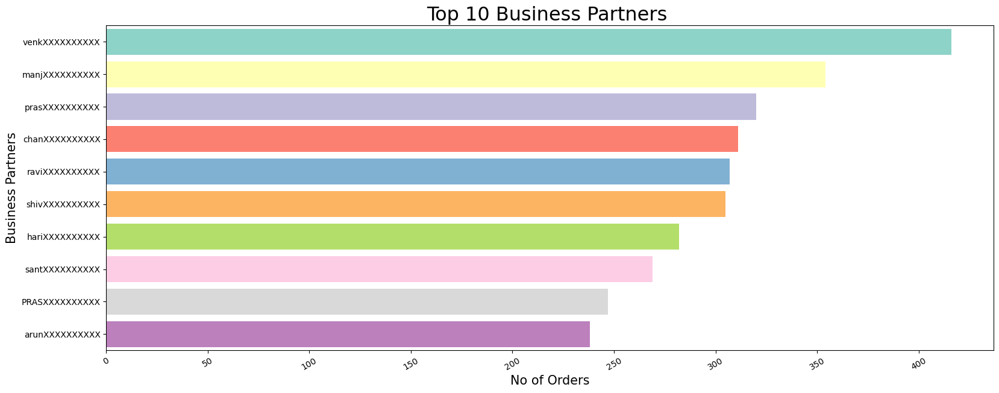

In [34]:
plt.figure(figsize=[19,7])
sns.countplot(data['business_partner_name'],order=data['business_partner_name'].value_counts().iloc[:10].index,saturation=10,palette="Set3")
plt.ylabel("Business Partners",fontdict={'fontsize':15},color='black')
plt.xlabel('No of Orders',fontdict={'fontsize':15},color='black')
plt.xticks(rotation=30)
plt.title("Top 10 Business Partners ",fontdict={'fontsize':23});

**Insights**
* Above are the top 10 Business Partners who has given the maximum nuber of orders.
* "venkXXXXXXXXXX" business partner has given the most number of orders, more than 400 orders.
* "manjXXXXXXXXXX" business partner has given the second most number of orders, more than 350 orders.

In [35]:
data['business_partner_name'].value_counts().iloc[-10:].values

array([2, 2, 2, 2, 2, 1, 1, 1, 1, 1], dtype=int64)

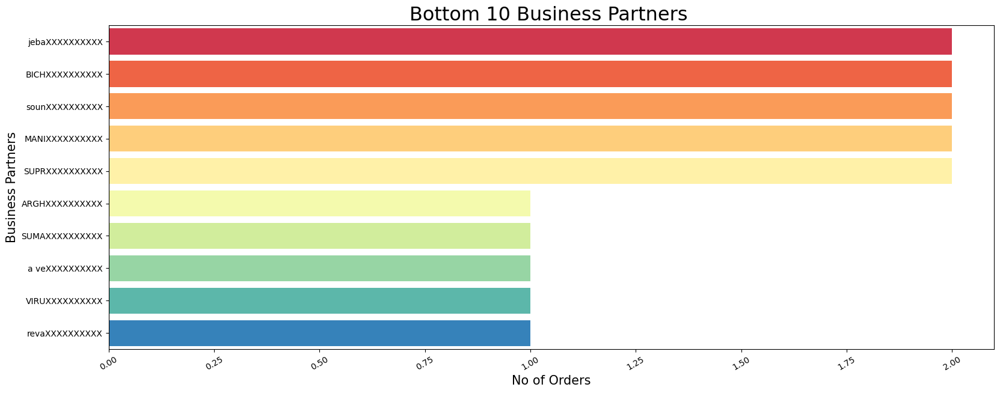

In [36]:
plt.figure(figsize=[19,7])
sns.countplot(data['business_partner_name'],order=data['business_partner_name'].value_counts().iloc[-10:].index,saturation=10,palette="Spectral")
plt.ylabel("Business Partners",fontdict={'fontsize':15},color='black')
plt.xlabel('No of Orders',fontdict={'fontsize':15},color='black')
plt.xticks(rotation=30)
plt.title("Bottom 10 Business Partners ",fontdict={'fontsize':23});

**Insights**
* Above are the bottom 10 Business Partners who has given the least nuber of orders.
* "revaXXXXXXXXXX","VIRUXXXXXXXXXX","a veXXXXXXXXXX","ARGHXXXXXXXXXX" and "SUMAXXXXXXXXXX" business partner has given the lowest number of orders, 1 order.
* "SUPRXXXXXXXXXX","MANIXXXXXXXXXX","sonuXXXXXXXXXX","BICHXXXXXXXXXX" and "jebaXXXXXXXXXX" business partner has given the second lowest number of orders, 2 orders.

In [37]:
data.groupby('invoice_line_text').count() # Count the value of each spare part and group them

,invoice_date,job_card_date,business_partner_name,vehicle_no,vehicle_model,current_km_reading,Orders_on_Demand,date_difference
invoice_line_text,,,,,,,,
10 SIZE NUT,2,2,2,2,2,2,2,2
12 SIZE BOLT,2,2,2,2,2,2,2,2
3M OIL,1615,1615,1615,1615,1615,1615,1615,1615
4 WAY SWITCH,2,2,2,2,2,2,2,2
6004 BEARING,2,2,2,2,2,2,2,2
6202 BEARING,1,1,1,1,1,1,1,1
6303 BEARING,1,1,1,1,1,1,1,1
8 SIZE BOLT,1,1,1,1,1,1,1,1
ACCELATOR CABLE,51,51,51,51,51,51,51,51


In [38]:
data.groupby('vehicle_model').count()

,invoice_date,job_card_date,business_partner_name,vehicle_no,current_km_reading,invoice_line_text,Orders_on_Demand,date_difference
vehicle_model,,,,,,,,
BAJAJ AVENGER STREET,1103,1103,1103,1103,1103,1103,1103,1103
BAJAJ AVENGER STREET 180,121,121,121,121,121,121,121,121
BAJAJ AVENGER STREET 220,4162,4162,4162,4162,4162,4162,4162,4162
BAJAJ BOXER CT,4,4,4,4,4,4,4,4
BAJAJ CALIBER,40,40,40,40,40,40,40,40
BAJAJ CT 100,1401,1401,1401,1401,1401,1401,1401,1401
BAJAJ DISCOVER,658,658,658,658,658,658,658,658
BAJAJ DISCOVER 125,1339,1339,1339,1339,1339,1339,1339,1339
BAJAJ DISCOVER 135,113,113,113,113,113,113,113,113


# Creating a new Dataframe containing Orders on Demand

In [39]:
data_new=data.groupby([data.job_card_date]).count()  #Number of orders on particular date

In [40]:
data_new

,invoice_date,business_partner_name,vehicle_no,vehicle_model,current_km_reading,invoice_line_text,Orders_on_Demand,date_difference
job_card_date,,,,,,,,
2017-01-06,48,48,48,48,48,48,48,48
2017-01-07,89,89,89,89,89,89,89,89
2017-01-08,48,48,48,48,48,48,48,48
2017-01-09,96,96,96,96,96,96,96,96
2017-01-10,18,18,18,18,18,18,18,18
2017-01-11,77,77,77,77,77,77,77,77
2017-01-12,5,5,5,5,5,5,5,5
2017-02-06,16,16,16,16,16,16,16,16
2017-02-08,29,29,29,29,29,29,29,29


In [41]:
data_new.drop(['business_partner_name','vehicle_no','vehicle_model','current_km_reading','date_difference','invoice_date','invoice_line_text'],axis=1,inplace=True)

In [42]:
data_new

,Orders_on_Demand
job_card_date,
2017-01-06,48
2017-01-07,89
2017-01-08,48
2017-01-09,96
2017-01-10,18
2017-01-11,77
2017-01-12,5
2017-02-06,16
2017-02-08,29


In [43]:
data_new.shape

(553, 1)

In [44]:
data_new.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 553 entries, 2017-01-06 to 2019-06-01
Data columns (total 1 columns):
 #   Column            Non-Null Count  Dtype
---  ------            --------------  -----
 0   Orders_on_Demand  553 non-null    int64
dtypes: int64(1)
memory usage: 8.6 KB


### Time series decomposition is the process of separating a time series into its constituent components, such as trend, seasonality, and noise.

* Trend: The trend component represents the long-term movement in the data, representing the underlying pattern.
* Seasonality: The seasonality component represents the repeating, short-term fluctuations caused by factors like seasons or cycles.
* Residual (Noise): The residual component represents random variability that remains after removing the trend and seasonality.

### In additive decomposition, the time series is expressed as the sum of its components:Y(t) = Trend(t) + Seasonal(t) + Residual(t)

In [45]:
from statsmodels.tsa.seasonal import seasonal_decompose

decomposition_additive = seasonal_decompose(data_new['Orders_on_Demand'],model='additive',period=6)

In [46]:
trend_additive=decomposition_additive.trend
seasonal_additive=decomposition_additive.seasonal
residual_additive=decomposition_additive.resid

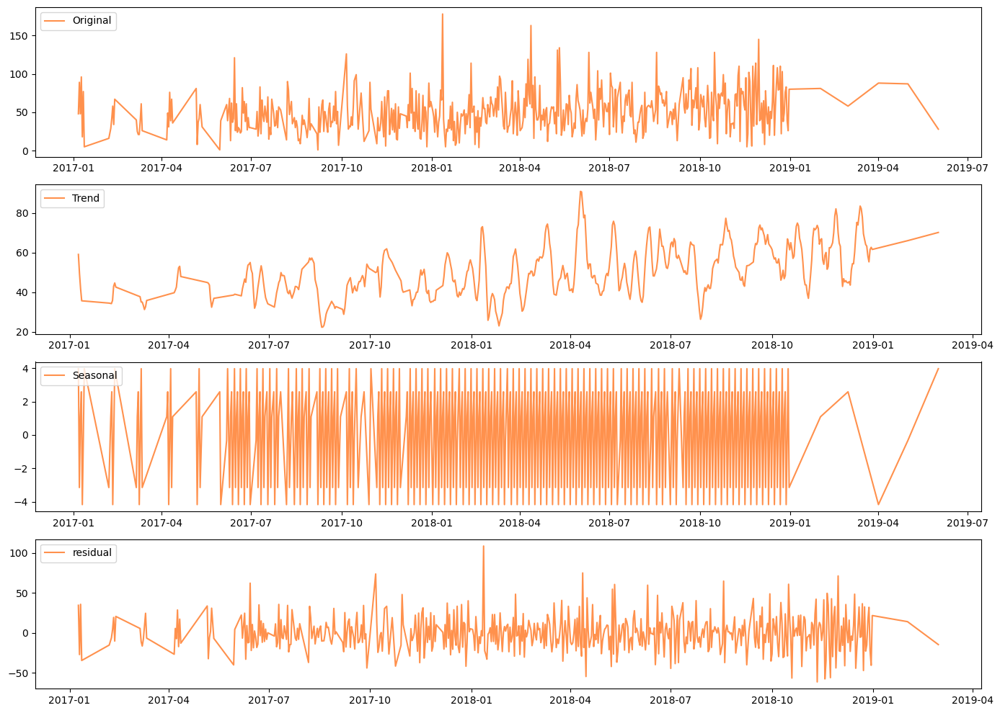

In [47]:
plt.figure(figsize=(14,10))
plt.subplot(411)
plt.plot(data_new['Orders_on_Demand'],label='Original',color='#FF914D')
plt.legend(loc='upper left')
plt.subplot(412)
plt.plot(trend_additive,label='Trend',color='#FF914D')
plt.legend(loc='upper left')
plt.subplot(413)
plt.plot(seasonal_additive,label='Seasonal',color='#FF914D')
plt.legend(loc='upper left')
plt.subplot(414)
plt.plot(residual_additive,label='residual',color='#FF914D')
plt.legend(loc='upper left')
plt.tight_layout()
plt.show()

### The Seasonal and Trend decomposition using Loess (STL) is a popular method for decomposition, which uses a combination of local regression (Loess) to extract the trend and seasonality components.

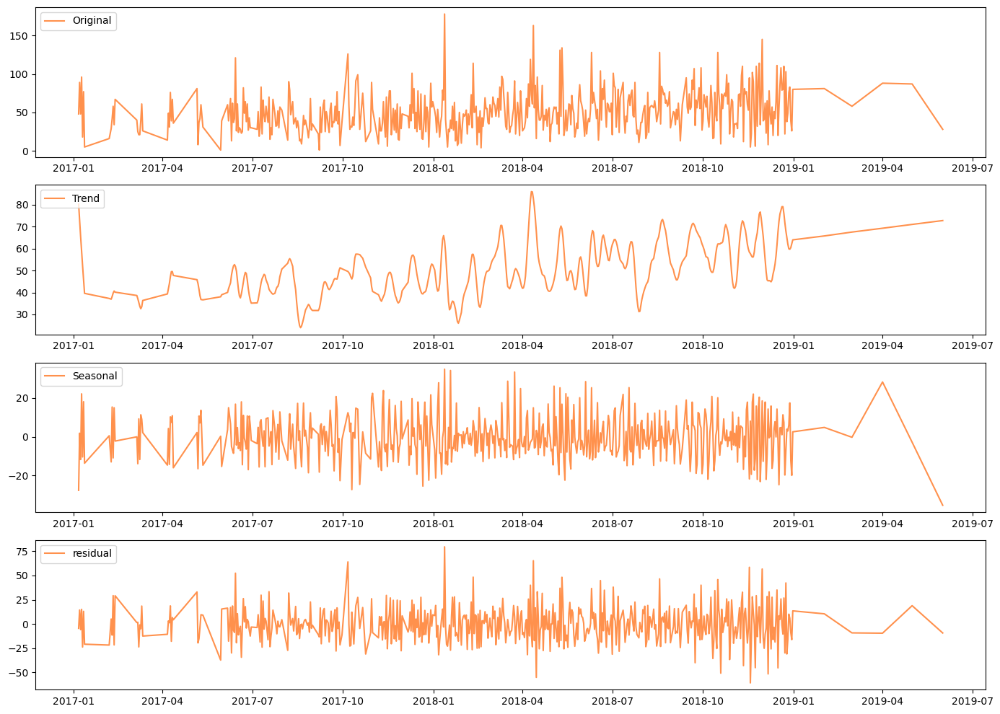

In [48]:
from statsmodels.tsa.seasonal import STL

#Perform STL Decomposition
stl = STL(data_new['Orders_on_Demand'],period=6)
result=stl.fit()

#plot the decomposition components
plt.figure(figsize=(14,10))
plt.subplot(411)
plt.plot(result.observed,label='Original',color='#FF914D')
plt.legend(loc='upper left')
plt.subplot(412)
plt.plot(result.trend,label='Trend',color='#FF914D')
plt.legend(loc='upper left')
plt.subplot(413)
plt.plot(result.seasonal,label='Seasonal',color='#FF914D')
plt.legend(loc='upper left')
plt.subplot(414)
plt.plot(result.resid,label='residual',color='#FF914D')
plt.legend(loc='upper left')
plt.tight_layout()
plt.show()

# Timeseries Forecasting

Text(0.5, 0, 'Job Card Date')

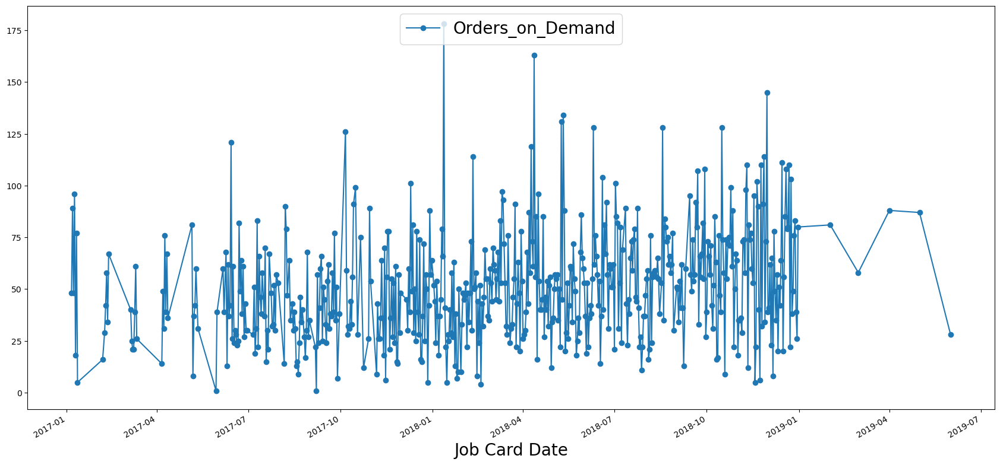

In [49]:
data_new.plot(figsize=(21,10),marker='o')
plt.legend(loc='upper center',frameon=True, labelspacing=1,fontsize=20)
plt.xlabel(xlabel='Job Card Date',fontdict={'fontsize':20})

## Check if given series is stationary or not:
- One way is to check autocorrelation.
- Autocorrelation is the similarity between observations as a function of the time lag between them.
- When plotting the value of the ACF for increasing lags (a plot called a correlogram), the values tend to degrade to zero quickly for stationary time series, while for non-stationary data the degradation will happen more slowly.

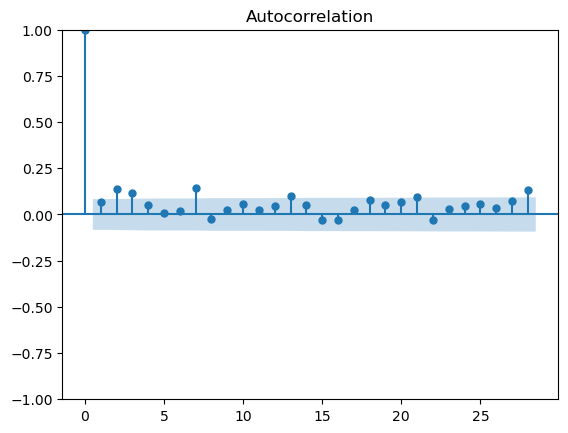

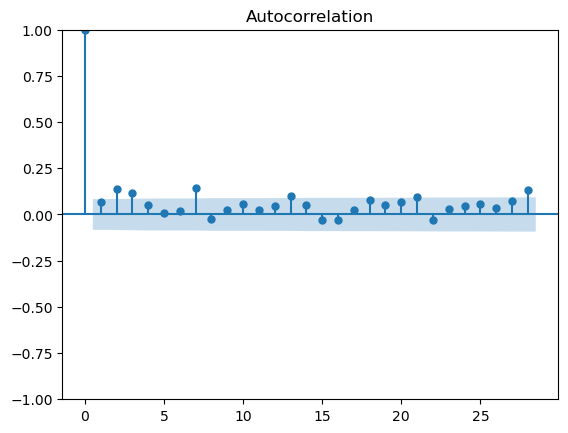

In [50]:
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(data_new)  

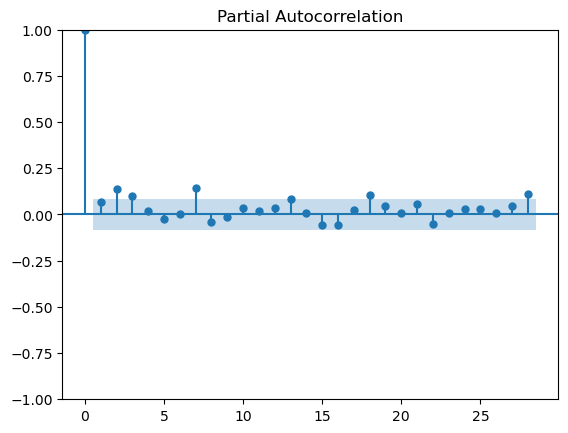

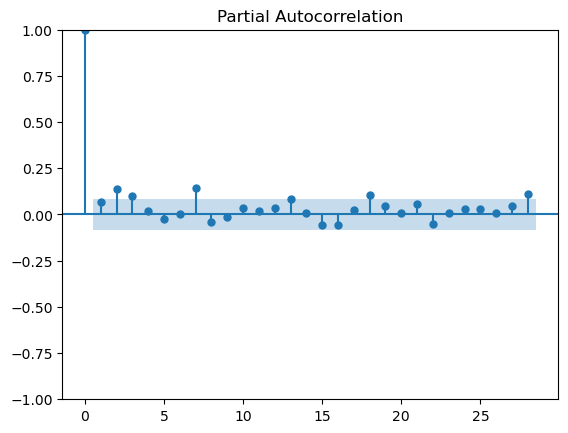

In [51]:
from statsmodels.graphics.tsaplots import plot_pacf
plot_pacf(data_new)  

### From the autocorrelation plot, it is clear that given series is stationary.

**We can perform the ADfuller test, a test based on hypothesis, where if the p-value is less than 0.05, then we can consider the time series is stationary, and if the P-value is greater than 0.05, then the time series is non-stationary.**

In [52]:
# ADfuller Test to check stationarity, IF P-Value < 0.05 then data is stationary
from statsmodels.tsa.stattools import adfuller

def check_stationarity(timeseries):
    # Perform the Dickey-Fuller test
    result = adfuller(timeseries, autolag='AIC')
    p_value = result[1]
    print(f'ADF Statistic: {result[0]}')
    print(f'p-value: {p_value}')
    print('Stationary' if p_value < 0.05 else 'Non-Stationary')


check_stationarity(data_new['Orders_on_Demand'])

ADF Statistic: -6.754397184473704
p-value: 2.8963756482883815e-09
Stationary


# Splitting Data Into Train and Test

In [53]:
data_new.shape

(553, 1)

In [54]:
train = data_new['2017-01-06':'2018-09-20']  # Adjust based on your dataset's time range
test = data_new['2018-09-21':'2019-06-01'] 

In [55]:
train.shape

(446, 1)

In [56]:
test.shape

(107, 1)

# Model Creation

### 1. AR(Auto Regressive) Model
* Autoregression is a time series model that uses observations from previous time steps as input to a regression equation to predict the value at the next time step. It is a very simple idea that can result in accurate forecasts on a range of time series problems.
* Yt depends only of past values.
* Yt-1, Yt-2, Yt-3 etc
              * Yt  = f(Yt-1, Yt-2, Yt-3… )
              * Yt = β0 + β1Yt-1 + β2Yt-2 + β3Yt-3 …

In [57]:
##from statsmodels.tsa.ar_model import AutoReg
import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.ar_model import AutoReg 

In [58]:
## model creation
ar_model=AutoReg(train,lags=50) ## object creation with lags 
ar_model_fit=ar_model.fit()#training the model
print(ar_model_fit.aic) #  Akaike Information Criteria 

3714.0071337491004


**AIC is an estimator of prediction error which measures a statistical model in order to quantify the goodness of fit of the model. While comparing two models, the smaller the AIC value, the better the time series model.**


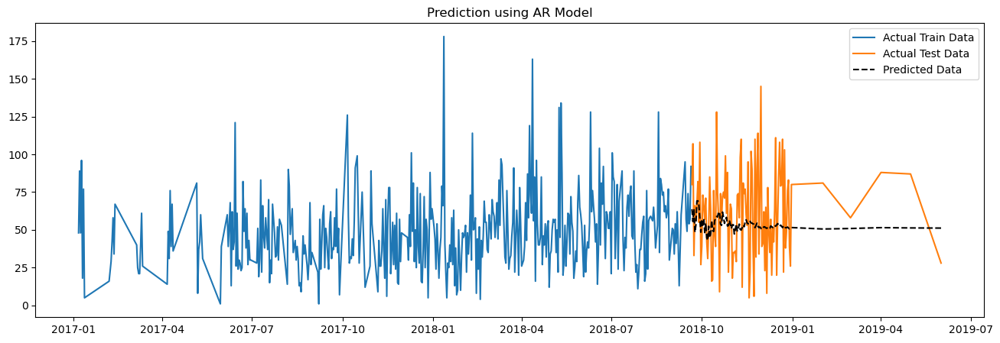

Mean Squared Error on Test Data: 938.30
RSME: 30.63


In [59]:
#Predcition on Test Data
forecast_ar = ar_model_fit.predict(start=len(train),end=len(train)+len(test)-1)
test['Predicted_ar'] = forecast_ar.values
#plot the actual vs predicted values
plt.figure(figsize=(16,5))
plt.plot(train,label='Actual Train Data')
plt.plot(test['Orders_on_Demand'], label="Actual Test Data")
plt.plot(test['Predicted_ar'] ,color='black',linestyle='--',label='Predicted Data')
plt.title('Prediction using AR Model')
plt.legend()
plt.show()


# Evaluate Model Performance
mse = mean_squared_error(test['Orders_on_Demand'],test['Predicted_ar'])
print(f"Mean Squared Error on Test Data: {mse:.2f}")
#evaluating model using RMSE score
rsme=round(np.sqrt(mean_squared_error(test['Orders_on_Demand'],test['Predicted_ar'])),2)
print('RSME:',rsme)

# Moving Average(MA) Model

In [60]:
## importing the library
from statsmodels.tsa.arima.model import ARIMA
model_ma=ARIMA(train,order=(0,0,5))
model_ma_fit=model_ma.fit()
print(model_ma_fit.aic) #  Akaike Information Criteria 

4135.377016977845


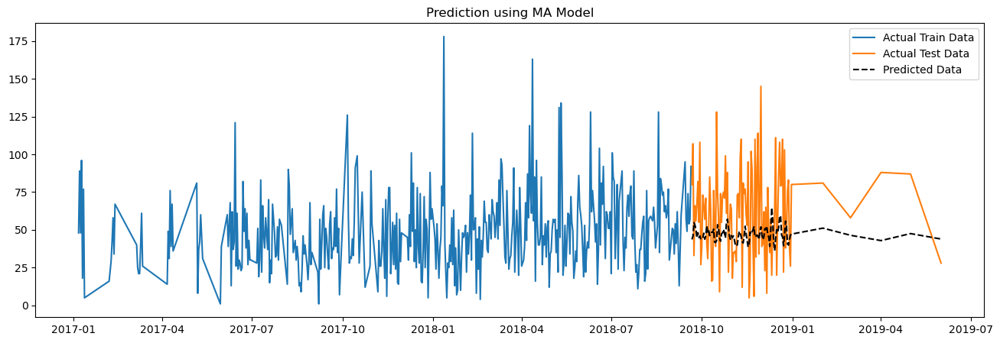

Mean Squared Error on Test Data: 1096.27
RSME: 33.11


In [61]:
forecast_ma = model_ma_fit.predict(start=50,end=156)
test['Predicted_ma'] = forecast_ma.values
#plot the actual vs predicted values
plt.figure(figsize=(16,5))

plt.plot(train,label='Actual Train Data')
plt.plot(test['Orders_on_Demand'], label="Actual Test Data")
plt.plot(test['Predicted_ma'] ,color='black',linestyle='--',label='Predicted Data')
plt.title('Prediction using MA Model')
plt.legend()
plt.show()

# Evaluate Model Performance
mse = mean_squared_error(test['Orders_on_Demand'], test['Predicted_ma'])
print(f"Mean Squared Error on Test Data: {mse:.2f}")
#evaluating model using RMSE score
rsme=round(np.sqrt(mean_squared_error(test['Orders_on_Demand'],test['Predicted_ma'])),2)
print('RSME:',rsme)

# Auto Regressive Moving Average (ARMA) Model

4132.234900645808


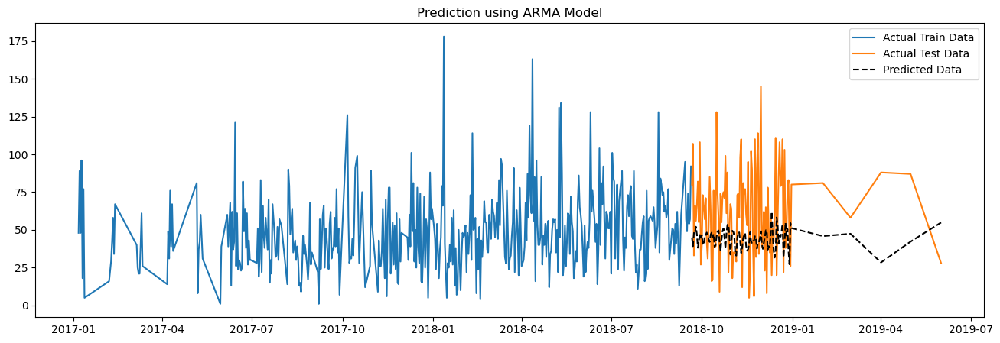

Mean Squared Error on Test Data: 1247.05
RSME: 35.31


In [62]:
from statsmodels.tsa.arima.model import ARIMA

model_arma=ARIMA(train,order=(5,0,5)) #order=p,d,q {AutoRegressive,Differencing,Moving Average}
model_arma_fit=model_arma.fit()
print(model_arma_fit.aic) #  Akaike Information Criteria 


forecast_arma = model_arma_fit.predict(start=50,end=156)
test['Predicted_arma'] = forecast_arma.values
#plot the actual vs predicted values
plt.figure(figsize=(16,5))
plt.plot(train,label='Actual Train Data')
plt.plot(test['Orders_on_Demand'], label="Actual Test Data")
plt.plot(test['Predicted_arma'],color='black',linestyle='--',label='Predicted Data')
plt.title('Prediction using ARMA Model')
plt.legend()
plt.show()


# Evaluate Model Performance
mse = mean_squared_error(test['Orders_on_Demand'], test['Predicted_arma'])
print(f"Mean Squared Error on Test Data: {mse:.2f}")
#evaluating model using RMSE score
rsme=round(np.sqrt(mean_squared_error(test['Orders_on_Demand'],test['Predicted_arma'])),2)
print('RSME:',rsme)

# Autoregressive Integrated Moving Average (ARIMA)  Model

AIC value : 4186.263144872595


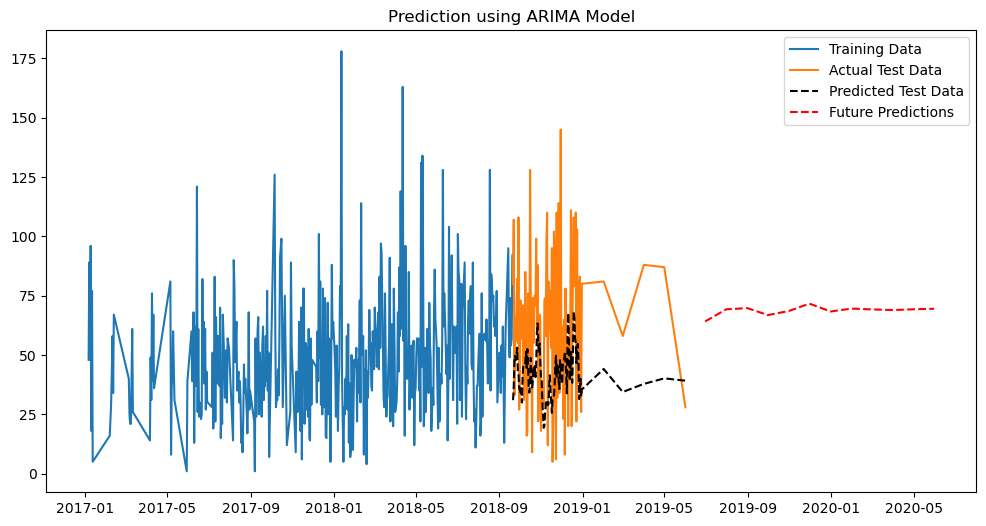

Mean Squared Error on Test Data: 1288.69
RSME: 35.9


In [63]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error


# Train ARIMA Model
model = ARIMA(train, order=(5,1,0))  # Adjust order based on data characteristics
model_arima_fit =model.fit()
print('AIC value :',model_arima_fit.aic) #  Akaike Information Criteria 

# Forecast on Test Data
forecast_arima = model_arima_fit.predict(start=50,end=156)
test['Predicted_arima'] = forecast_arima.values

# Predict Future Data
future_steps = 12 # Predicting 1 year ahead 
future_forecast = model_arima_fit.forecast(steps=future_steps)
future_dates = pd.date_range(start="2019-06-02", end="2020-06-01", freq="M")  # predicting from 2/6/2019-1/6/2020
future_data = pd.DataFrame({'Date': future_dates, 'Predicted': future_forecast})
future_data.set_index('Date', inplace=True)

# Plot Results
plt.figure(figsize=(12, 6))
plt.plot(train, label="Training Data")
plt.plot(test['Orders_on_Demand'], label="Actual Test Data")
plt.plot(test['Predicted_arima'], label="Predicted Test Data", linestyle="--",color="black")
plt.plot(future_data['Predicted'], label="Future Predictions", linestyle="--", color="red")
plt.title('Prediction using ARIMA Model')
plt.legend()
plt.show()

# Evaluate Model Performance
mse = mean_squared_error(test['Orders_on_Demand'], test['Predicted_arima'])
print(f"Mean Squared Error on Test Data: {mse:.2f}")
rsme=round(np.sqrt(mean_squared_error(test['Orders_on_Demand'],test['Predicted_arima'])),2)
print('RSME:',rsme)

In [64]:
import itertools

p =d= q=range(0,5)#values of p,d,q range from 0 to 4

pdq = list(itertools.product(p,d,q))
# is used to find the cartesian product from the given iterator, output is lexicographic ordered.
pdq #number of combinaton of pdq

[(0, 0, 0),
 (0, 0, 1),
 (0, 0, 2),
 (0, 0, 3),
 (0, 0, 4),
 (0, 1, 0),
 (0, 1, 1),
 (0, 1, 2),
 (0, 1, 3),
 (0, 1, 4),
 (0, 2, 0),
 (0, 2, 1),
 (0, 2, 2),
 (0, 2, 3),
 (0, 2, 4),
 (0, 3, 0),
 (0, 3, 1),
 (0, 3, 2),
 (0, 3, 3),
 (0, 3, 4),
 (0, 4, 0),
 (0, 4, 1),
 (0, 4, 2),
 (0, 4, 3),
 (0, 4, 4),
 (1, 0, 0),
 (1, 0, 1),
 (1, 0, 2),
 (1, 0, 3),
 (1, 0, 4),
 (1, 1, 0),
 (1, 1, 1),
 (1, 1, 2),
 (1, 1, 3),
 (1, 1, 4),
 (1, 2, 0),
 (1, 2, 1),
 (1, 2, 2),
 (1, 2, 3),
 (1, 2, 4),
 (1, 3, 0),
 (1, 3, 1),
 (1, 3, 2),
 (1, 3, 3),
 (1, 3, 4),
 (1, 4, 0),
 (1, 4, 1),
 (1, 4, 2),
 (1, 4, 3),
 (1, 4, 4),
 (2, 0, 0),
 (2, 0, 1),
 (2, 0, 2),
 (2, 0, 3),
 (2, 0, 4),
 (2, 1, 0),
 (2, 1, 1),
 (2, 1, 2),
 (2, 1, 3),
 (2, 1, 4),
 (2, 2, 0),
 (2, 2, 1),
 (2, 2, 2),
 (2, 2, 3),
 (2, 2, 4),
 (2, 3, 0),
 (2, 3, 1),
 (2, 3, 2),
 (2, 3, 3),
 (2, 3, 4),
 (2, 4, 0),
 (2, 4, 1),
 (2, 4, 2),
 (2, 4, 3),
 (2, 4, 4),
 (3, 0, 0),
 (3, 0, 1),
 (3, 0, 2),
 (3, 0, 3),
 (3, 0, 4),
 (3, 1, 0),
 (3, 1, 1),
 (3, 1, 2),
 (3,

In [65]:
##The Python try… except statement catches an exception. It is used to test code for an error which is written in the “try” statement.
#If an error is encountered, the contents of the “except” block are run.
list1=[]
list2=[]
for params in pdq: #iterating params over pdq
    try:
        model_arima = ARIMA(train, order=params)#training model on various pdq values
        model_arima_fit = model_arima.fit()#training
        print(params, model_arima_fit.aic)#printing parameter and aic values
        list1.append(params)
        list2.append(model_arima_fit.aic)
    except:
        continue

(0, 0, 0) 4144.298878434602
(0, 0, 1) 4144.608327137699
(0, 0, 2) 4133.5960258659
(0, 0, 3) 4132.35772453646
(0, 0, 4) 4134.357323813556
(0, 1, 0) 4408.050404282087
(0, 1, 1) 4128.646046382005
(0, 1, 2) 4130.24471259272
(0, 1, 3) 4122.590714440734
(0, 1, 4) 4122.964898081451
(0, 2, 0) 4902.032330651517
(0, 2, 1) 4407.250964251736
(0, 2, 2) 4132.955002669444
(0, 2, 3) 4134.430383036084
(0, 2, 4) 4127.607402055177
(0, 3, 0) 5436.955455459456
(0, 3, 1) 4900.036230902124
(0, 3, 2) 4412.134532634129
(0, 3, 3) 4149.877781510154
(0, 3, 4) 4156.680543714955
(0, 4, 0) 5986.784138563528
(0, 4, 1) 5432.931339523194
(0, 4, 2) 4902.425577949043
(0, 4, 3) 4424.051764135875
(0, 4, 4) 4206.600549876802
(1, 0, 0) 4144.033254651792
(1, 0, 1) 4138.314595058326
(1, 0, 2) 4133.015588441091
(1, 0, 3) 4134.356545778829
(1, 0, 4) 4136.293890744257
(1, 1, 0) 4245.683340300391
(1, 1, 1) 4130.128881912466
(1, 1, 2) 4132.312815186084
(1, 1, 3) 4123.5501580784785
(1, 1, 4) 4125.401770965496
(1, 2, 0) 4586.90590852

In [66]:
loc=list2.index(min(list2))
list1[loc]

(0, 1, 3)

In [67]:
model_arima = ARIMA(train, order=(0,1,3))

model_arima_fit1 = model_arima.fit() #training

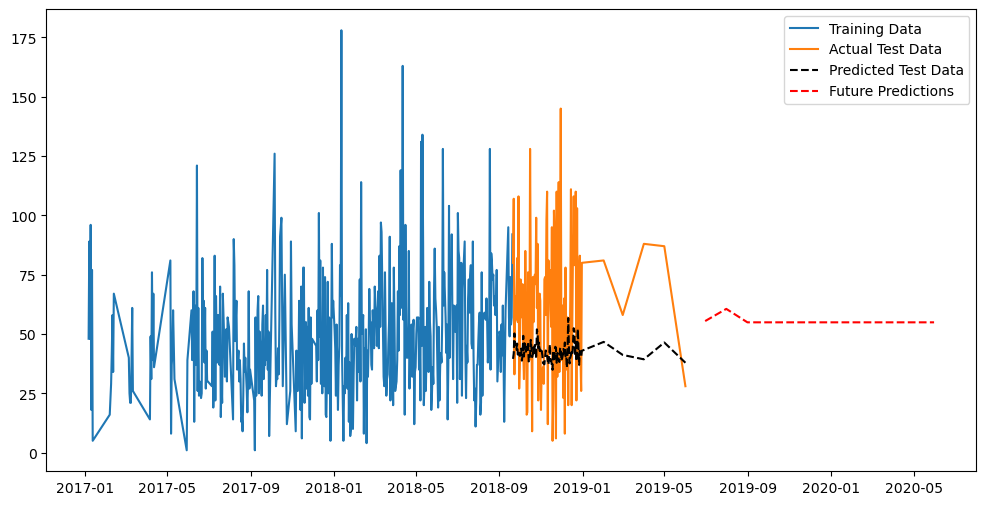

Mean Squared Error on Test Data: 1232.64
RSME: 35.11


In [68]:
forecast_arima1 = model_arima_fit1.predict(start=50,end=156)
test['Predicted_arima1'] = forecast_arima1.values

# Predict Future Data
future_steps = 12 # Predicting 1 year ahead 
future_forecast = model_arima_fit1.forecast(steps=future_steps)
future_dates = pd.date_range(start="2019-06-02", end="2020-06-01", freq="M") #frequency "M" means forecasting on monthly basis from 2/6/2019-1/6/2020
future_data = pd.DataFrame({'Date': future_dates, 'Predicted': future_forecast})
future_data.set_index('Date', inplace=True)

# Plot Results
plt.figure(figsize=(12, 6))
plt.plot(train, label="Training Data")
plt.plot(test['Orders_on_Demand'], label="Actual Test Data")
plt.plot(test['Predicted_arima1'], label="Predicted Test Data", linestyle="--",color="black")
plt.plot(future_data['Predicted'], label="Future Predictions", linestyle="--", color="red")

plt.legend()
plt.show()

# Evaluate Model Performance
mse = mean_squared_error(test['Orders_on_Demand'], test['Predicted_arima1'])
print(f"Mean Squared Error on Test Data: {mse:.2f}")
rsme=round(np.sqrt(mean_squared_error(test['Orders_on_Demand'],test['Predicted_arima1'])),2)
print('RSME:',rsme)

# Seasonal Autoregressive Integrated Moving Average (SARIMA) Model

AIC value : 4057.9580955446613


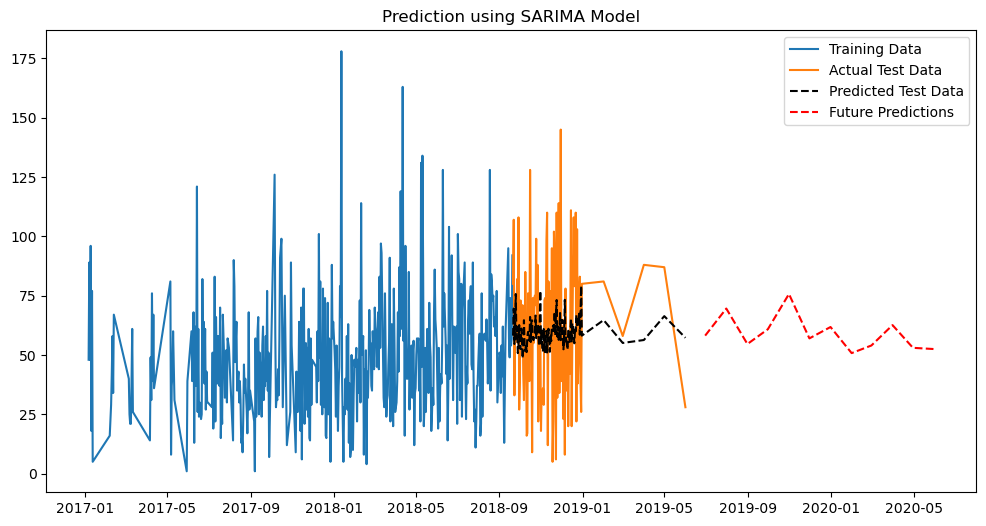

Mean Squared Error on Test Data: 909.68
RSME: 30.16


In [69]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
p,d,q=0,1,3
P,D,Q,s=3,1,3,12
# Train SARIMA Model
model_sarima=SARIMAX(train,order=(p,d,q),seasonal_order=(P,D,Q,s))
model_sarima_fit=model_sarima.fit()
print('AIC value :',model_sarima_fit.aic) #  Akaike Information Criteria 

# Forecast on Test Data
forecast_sarima=model_sarima_fit.predict(start=len(train),end=len(train)+len(test)-1)
test['Predicted_sarima'] = forecast_sarima.values

# Predict Future Data
future_steps = 12 # Predicting 1 year ahead 
future_forecast = model_sarima_fit.forecast(steps=future_steps)
future_dates = pd.date_range(start="2019-06-02", end="2020-06-01", freq="M")  # forecasting from 2/6/2019-1/6/2020
future_data = pd.DataFrame({'Date': future_dates, 'Predicted': future_forecast})
future_data.set_index('Date', inplace=True)

# Plot Results
plt.figure(figsize=(12, 6))
plt.plot(train, label="Training Data")
plt.plot(test['Orders_on_Demand'], label="Actual Test Data")
plt.plot(test['Predicted_sarima'], label="Predicted Test Data", linestyle="--",color="black")
plt.plot(future_data['Predicted'], label="Future Predictions", linestyle="--", color="red")
plt.title('Prediction using SARIMA Model')
plt.legend()
plt.show()

# Evaluate Model Performance
mse = mean_squared_error(test['Orders_on_Demand'], test['Predicted_sarima'])
print(f"Mean Squared Error on Test Data: {mse:.2f}")
rsme=round(np.sqrt(mean_squared_error(test['Orders_on_Demand'],test['Predicted_sarima'])),2)
print('RSME:',rsme)

### auto_arima : For best values of p,d,q & P,D,Q,s

In [70]:
import pandas as pd
from pmdarima import auto_arima
from statsmodels.tsa.statespace.sarimax import SARIMAX
import warnings

In [71]:
seasonal_period = 12

auto_model = auto_arima(
    train,
    start_p=0, max_p=4,        # Non-seasonal AR order range
    start_q=0, max_q=4,        # Non-seasonal MA order range
    seasonal=True,
    m=seasonal_period,         # Seasonal periodicity
    start_P=0, max_P=3,        # Seasonal AR order range
    start_Q=0, max_Q=3,        # Seasonal MA order range
    max_order=None,            # Max combined order (p+q+P+Q)
    d=None,                    # Auto-detect differencing for stationarity
    D=1,                       # Seasonal differencing order (start with 1)
    trace=True,                # Show progress
    error_action='ignore',     # Ignore errors for invalid models
    suppress_warnings=True,
    stepwise=True              # Use a stepwise algorithm for efficiency
)

# Optimal parameters
print("Best Parameters (SARIMAX):", auto_model.order, auto_model.seasonal_order)

# Fit the best SARIMAX model
model = SARIMAX(
    train,
    order=auto_model.order,
    seasonal_order=auto_model.seasonal_order,
    enforce_stationarity=False,
    enforce_invertibility=False
)

fitted_model = model.fit(disp=False)
print(fitted_model.summary())

# Forecasting
forecast_steps = 12  # Forecast the next 12 steps
forecast = fitted_model.get_forecast(steps=forecast_steps)
forecast_df = forecast.summary_frame()
print(forecast_df)

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=4306.862, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=4210.888, Time=0.29 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=4304.897, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=4308.695, Time=0.07 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=4166.870, Time=0.74 sec
 ARIMA(1,0,0)(3,1,0)[12] intercept   : AIC=4140.890, Time=1.86 sec
 ARIMA(1,0,0)(3,1,1)[12] intercept   : AIC=inf, Time=2.00 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.59 sec
 ARIMA(0,0,0)(3,1,0)[12] intercept   : AIC=4139.881, Time=2.72 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=4166.394, Time=1.37 sec
 ARIMA(0,0,0)(3,1,1)[12] intercept   : AIC=inf, Time=1.47 sec
 ARIMA(0,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(0,0,1)(3,1,0)[12] intercept   : AIC=4141.126, Time=2.82 sec
 ARIMA(1,0,1)(3,1,0)[12] intercept   : AIC=4

AIC value : 4130.705421178787


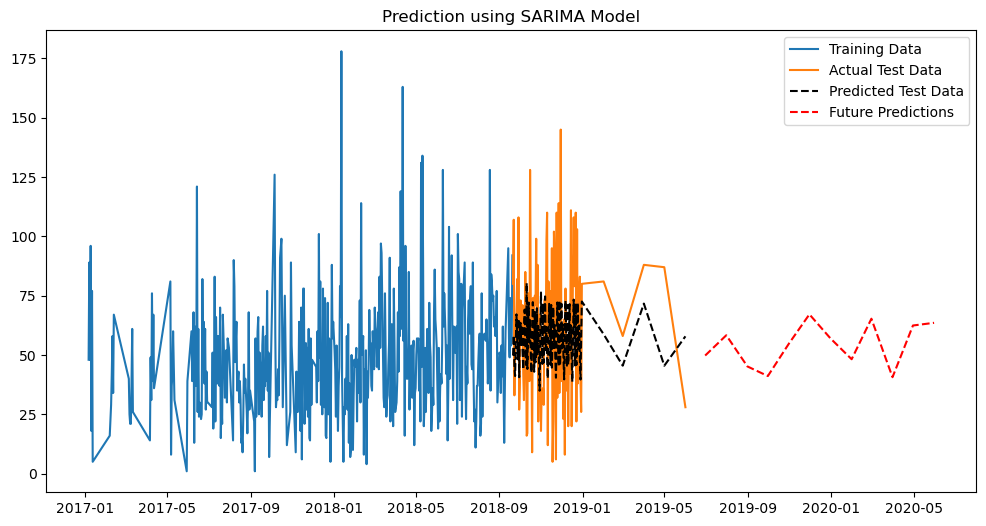

Mean Squared Error on Test Data: 951.91
RSME: 30.85


In [72]:
model_sarima1=SARIMAX(train,order=(2,0,0),seasonal_order=(3,1,0,12))
model_sarima_fit1=model_sarima1.fit()
print('AIC value :',model_sarima_fit1.aic) #  Akaike Information Criteria 

# Forecast on Test Data
forecast_sarima1=model_sarima_fit1.predict(start=len(train),end=len(train)+len(test)-1)
test['Predicted_sarima1'] = forecast_sarima1.values

# Predict Future Data
future_steps = 12 # Predicting 1 year ahead 
future_forecast = model_sarima_fit1.forecast(steps=future_steps)
future_dates = pd.date_range(start="2019-06-02", end="2020-06-01", freq="M")  # Adjust dates
future_data = pd.DataFrame({'Date': future_dates, 'Predicted': future_forecast})
future_data.set_index('Date', inplace=True)

# Plot Results
plt.figure(figsize=(12, 6))
plt.plot(train, label="Training Data")
plt.plot(test['Orders_on_Demand'], label="Actual Test Data")
plt.plot(test['Predicted_sarima1'], label="Predicted Test Data", linestyle="--",color="black")
plt.plot(future_data['Predicted'], label="Future Predictions", linestyle="--", color="red")
plt.title('Prediction using SARIMA Model')
plt.legend()
plt.show()

# Evaluate Model Performance
mse = mean_squared_error(test['Orders_on_Demand'], test['Predicted_sarima1'])
print(f"Mean Squared Error on Test Data: {mse:.2f}")
rsme=round(np.sqrt(mean_squared_error(test['Orders_on_Demand'],test['Predicted_sarima1'])),2)
print('RSME:',rsme)

In [78]:
model_list=['AR Model','MA Model','ARMA Model','ARIMA Model','ARIMA Model With Best Values of p,d,q','SARIMA Model','SARIMA Model With Best Values of p,d,q & P,D,Q,s']
mean_squared_error_list=[938.30,1096.27,1247.05,1288.69,1232.64,909.68,951.91]
rsme_list=[30.63,33.11,35.31,35.9,35.11,30.16,30.85]

In [83]:
# Create a DataFrame to store the evaluation results
evaluation_df1 = pd.DataFrame({'Model': model_list,'RSME Score': rsme_list})
evaluation_df2 = pd.DataFrame({'Model': model_list,'Mean Squared Error': mean_squared_error_list})

# Print the DataFrame
print(evaluation_df1)
print(evaluation_df2)


                                              Model  RSME Score
0                                          AR Model       30.63
1                                          MA Model       33.11
2                                        ARMA Model       35.31
3                                       ARIMA Model       35.90
4             ARIMA Model With Best Values of p,d,q       35.11
5                                      SARIMA Model       30.16
6  SARIMA Model With Best Values of p,d,q & P,D,Q,s       30.85
                                              Model  Mean Squared Error
0                                          AR Model              938.30
1                                          MA Model             1096.27
2                                        ARMA Model             1247.05
3                                       ARIMA Model             1288.69
4             ARIMA Model With Best Values of p,d,q             1232.64
5                                      SARIMA Model     

# Conclusion

* Based on the evaluation of various Time Series models, it can be concluded that the best performing model for the task of Prediction of inventory forecasting is SARIMA Model.
* This conclusion is based on several evaluation factors includes  Mean Squared Error: 909.68, RSME Score: 30.16 , which is lowest from all other models. 
* After SARIMA model, AR Model is the good performing model with  Mean Squared Error: 938.30, RSME Score: 30.63. 

# Report on Challenges faced

## There were several challenges faced during the data preprocessing and model building process.

**Missing values:** missing values were found in the dataset, which are very low compared with dataset, so we drop the missing value.

**Duplicates:** Duplicates were found in the dataset, which are very low compared with dataset, so we drop the duplicate value.

**Categorical variables:** The dataset contained categorical variables, which were 'invoice_date', 'job_card_date', 'business_partner_name', 'vehicle_no, 'vehicle_model', 'invoice_line_text'.

**Data Conversion:** The 'invoice_date' and 'job_car_date' columns datatype are converted into DateTime.

**Data Creation:** Creation of new column 'Order_on_demand' having the count of orders.

**Data splitting:** The dataset was split into training and testing sets from training dates:['2017-01-06':'2018-09-20'] and                      testing dates:['2018-09-21':'2019-06-01'].

**Model Selection:** Choosing the most suitable Time Series Model for the prediction task was another challenge. We experimented with various models including Auto Regressive(AR), Moving Average(MA), Auto Regressive Moving Average(ARMA), Autoregressive Integrated Moving Average(ARIMA) and Seasonal Autoregressive Integrated Moving Average(SARIMA).

## Techniques Used:

**Data Created:** We created new dataframe 'data_new' containing 'Order_on_demand'.

**Data Decomposition:** Time series decomposition is the process of separating a time series into its constituent components, such as trend, seasonality, and noise. We implemnted the Seasonal and Trend decomposition using Loess (STL) is a popular method for decomposition, which uses a combination of local regression (Loess) to extract the trend and seasonality components.

**Checking Satationarity:** We implemented AutoCorrelation(ACF) & PartialAutoCorrelation(PACF) graphs to check Stationarity. Another method used is  ADfuller Test to check Stationarity of data. 
